## Введение

Перед нами стоит **задача**: разработать демонстрационную версию поиска изображений по запросу.
По ссылке заказчик предоставил исходные данные. 
Разобьём задачу на несколько этапов:
* **Исследовательский анализ данных**;
* **Проверка данных**;
* **Векторизация**;
* **Обучение модели**;
* **Тестирование**.

Первым делом проведём **исследовательский анализ данных**. Подготовимся к работе. Импортируем необходимые библиотеки, построим функции для визуализации данных, зададим константы, загрузим данные и проанализируем их: выведем несколько строк, изображений и основную информацию о датасетах, посмотрим на уникальные значения в столбцах, проверим данные на пропуски и дубликаты. Для дальнейшей работы сформируем единый датасет с единой оценкой.

На этапе **проверки данных** необходимо учесть, что некоторые страны, в которых работает компания, есть закон, запрещающий выкладывать информацию о детях (до 16 лет). Создадим словарь слов, которые могли бы указывать на наличие ребёнка на изображении. Пропишем функцию, которая определит, что в описании присутствует слово из данного словаря. Исключим изображения с детьми из сформированного на прошлом этапе датасета. 

Перейдём к **векторизации**. На данном этапе необходимо векторизовать описания и изображения. Для ускорения процесса отберём уникальные изображения и описания. Для векторизации изображений воспользуемся архитектурой **ResNet-18**. Для векторизации текста загрузим предобученную модель **BERT**. Полученные на выходе датафреймы объединим.

Приступим к этапу **обучения модели**. Датасет разделим на обучающую и валидационную выборки в соотношении 80% на 20%. Чтобы исключить попадание изображения  и в обучающую, и в тестовую выборки воспользуемся классом **GroupShuffleSplit**. Целевой признак **mark** вынесем в отдельные датафреймы.
В качестве обучения будем исследовать две модели:
* **Линейная регрессия**
* **Полносвязная нейронная сеть**
В качестве метрики примем **RMSE**. Это позволит ускорить процесс обучения нейронной сети. 
Обучим линейную регрессию, построим и обучим последовательную архитектуру нейронной сети. 

Для **тестирования** выберем модель, которая покажет лучшее значением метрики. Выберем случайные 10 запросов из тестового файла и для каждого запроса выведем наиболее релевантное изображение. Сравним визуально качество поиска.

## Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


### Подготовка к работе

Установим и импортируем необходимые для работы библиотеки. 

In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [2]:
#! pip install torchvision

In [3]:
#! pip install --upgrade transformers

In [4]:
#! pip install sentence_transformers

In [5]:
#! pip install --upgrade tensorflow

In [6]:
#! pip install --upgrade keras

In [7]:
import numpy as np
import pandas as pd
from zipfile import ZipFile
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms
from tqdm import tqdm
import transformers 
from transformers import BertTokenizer, BertModel
from tqdm import trange
tqdm.pandas()
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.linear_model import LinearRegression
from sentence_transformers import SentenceTransformer, util
import tensorflow as tf
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, ELU, BatchNormalization, Reshape, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import RootMeanSquaredError
import math
from math import ceil
import os
from sklearn.dummy import DummyRegressor
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings('ignore')

Пропишем функции, которые понадобятся нам на данном этапе работы.

In [8]:
#гистограмма

def hist_graf(data, name, title, y_name, x_name, bins):
    print()
    print('\033[1m' + f'Описание признака {name}:' + '\033[0m')
    print()
    print(data.describe())
    print()
    
    data.plot(
        kind='hist', 
        title=title, 
        bins=bins, 
        grid=True, 
        figsize = (15,8),
        color = '#35c0cd',
        edgecolor='black');
    plt.ylabel(y_name)
    plt.xlabel(x_name);

In [9]:
#столбчатыый график

def grafik_bar(graf):
    for r in graf:
        splot=graf.plot(
        figsize=(15,8), 
        kind='bar',
        grid=True,
        color = '#35c0cd')
        for i in splot.patches:
            splot.annotate(format(i.get_height(), '.1f'), 
                   (i.get_x() + i.get_width() / 2., i.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

In [10]:
#столбчатый график для нескольких видов

def manybars (data, x, y, h, ylabel, xlabel, title,a,b,w):
    sns.set (font_scale= 1.2)
    sns.set_style("whitegrid")
    f, ax = plt.subplots(figsize=(20, 10))
    ax.tick_params(axis='x', labelrotation = 15)
    sns.barplot(data = data, 
                x = x,
                y = y,
                hue = h,
                palette='Set3',
                width = w)

    plt.legend(bbox_to_anchor=(a, b))
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    plt.title(title);
    plt.show()

Зададим константы.

In [11]:
RANDOM_STATE=12345
PATH = 'project_4/to_upload/'

### Загрузка и анализ данных

Скачать архив с входными данными можно по ссылке, указанной в разделе **Описание данных**. Разархивируем скаченный файл в папку **project_4**.

In [12]:
archive = 'dsplus_integrated_project_4.zip'
with ZipFile(archive, 'r') as file:
    file.extractall('project_4')

Загрузим датасеты.

In [13]:
df_train = pd.read_csv(PATH + 'train_dataset.csv')
df_test_query = pd.read_csv(PATH + 'test_queries.csv', index_col=[0], sep='|')
df_test_images = pd.read_csv(PATH + 'test_images.csv', index_col=[0], sep='|')
df_crowd = pd.read_csv((PATH + 'CrowdAnnotations.tsv'), sep='\t', names = ['image', 'query_id', 'fraction', 'respond', 'no_respond'])
df_expert = pd.read_csv((PATH + 'ExpertAnnotations.tsv'), sep='\t', names = ['image', 'query_id', 'first_exp', 'second_exp', 'third_exp'])

В переданном архиве оказалось 5 датасетов и 2 папки с изображениями. Изучим входные данные.


Датафрейм ИНФОРМАЦИЯ ДЛЯ ОБУЧЕНИЯ

Основная информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


None


Выведем первые 5 строк датафрейма для ознакомления с данными:


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...



Выведем на экран несколько изображений:


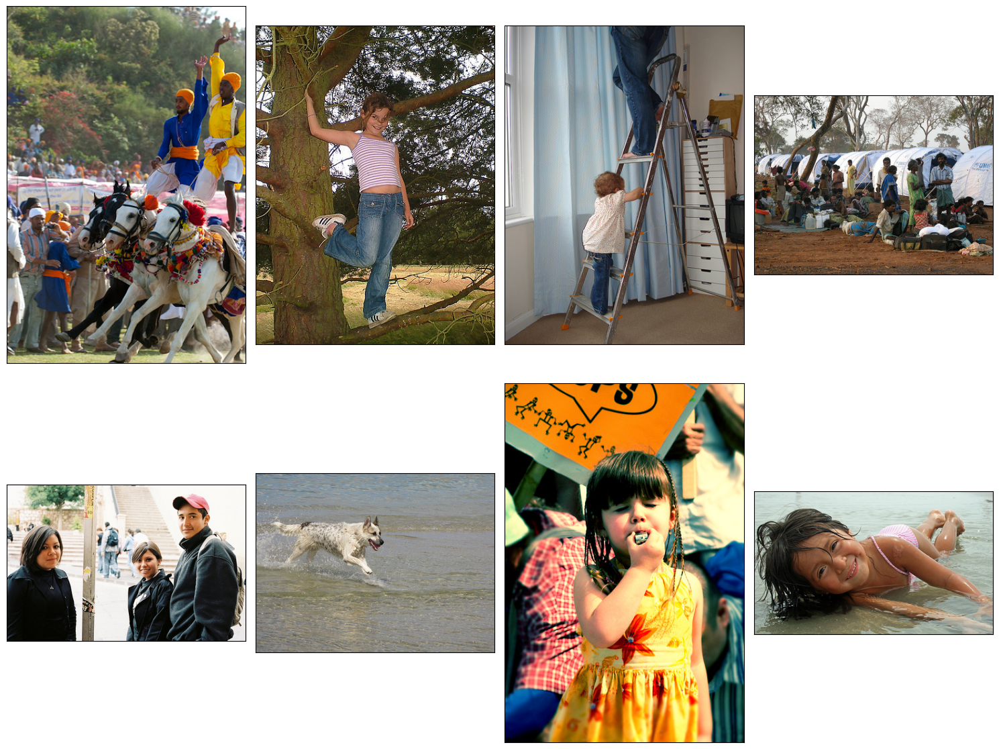


Количество уникальных изображений:


1000


Количество уникальных текстов:


977



Посмотрим на перечень названий столбцов:


Index(['image', 'query_id', 'query_text'], dtype='object')


Определим, в каких стобцах есть пропуски:


image         0
query_id      0
query_text    0
dtype: int64

Проверим данные на полные дубликаты:


0




Датафрейм ИНФОРМАЦИЯ ДЛЯ ТЕСТИРОВАНИЯ

Основная информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


None


Выведем первые 5 строк датафрейма для ознакомления с данными:


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg



Выведем на экран несколько изображений:


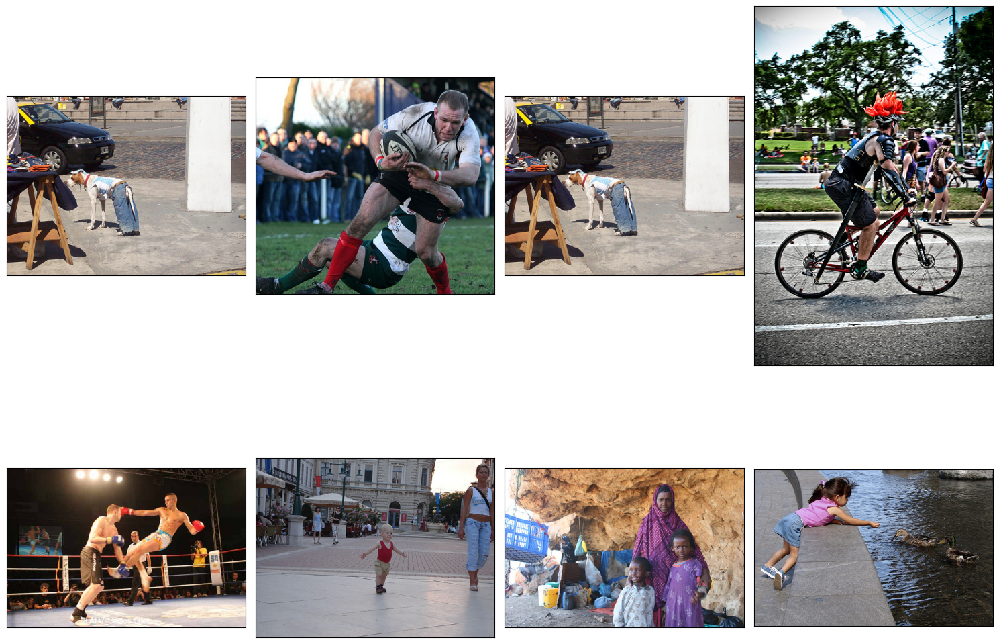


Количество уникальных изображений:


100


Количество уникальных текстов:


500


Посмотрим на перечень названий столбцов:


Index(['query_id', 'query_text', 'image'], dtype='object')


Определим, в каких стобцах есть пропуски:


query_id      0
query_text    0
image         0
dtype: int64

Проверим данные на полные дубликаты:


0




Датафрейм ИЗОБРАЖЕНИЯ ДЛЯ ТЕСТИРОВАНИЯ

Основная информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
Index: 100 entries, 3356748019_2251399314.jpg to 2346402952_e47d0065b6.jpg
Empty DataFrame


None


Выведем первые 5 строк датафрейма для ознакомления с данными:


""
image
3356748019_2251399314.jpg
2887171449_f54a2b9f39.jpg
3089107423_81a24eaf18.jpg
1429546659_44cb09cbe2.jpg
1177994172_10d143cb8d.jpg




Датафрейм СООТВЕТСТВИЕ ИЗОБРАЖЕНИЯ И ОПИСАНИЯ(КРАУДСОРТИНГ)

Основная информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       47830 non-null  object 
 1   query_id    47830 non-null  object 
 2   fraction    47830 non-null  float64
 3   respond     47830 non-null  int64  
 4   no_respond  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


None


Выведем первые 5 строк датафрейма для ознакомления с данными:


,image,query_id,fraction,respond,no_respond
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3



Уникальные значения столбца respond:


array([0, 1, 2, 3, 4, 5], dtype=int64)


Уникальные значения столбца no_respond:


array([0, 1, 2, 3, 4, 5, 6], dtype=int64)


5. Описание данных: 
           fraction       respond    no_respond
count  47830.000000  47830.000000  47830.000000
mean       0.068786      0.208488      2.820155
std        0.207532      0.628898      0.656676
min        0.000000      0.000000      0.000000
25%        0.000000      0.000000      3.000000
50%        0.000000      0.000000      3.000000
75%        0.000000      0.000000      3.000000
max        1.000000      5.000000      6.000000

Посмотрим на перечень названий столбцов:


Index(['image', 'query_id', 'fraction', 'respond', 'no_respond'], dtype='object')


Определим, в каких стобцах есть пропуски:


image         0
query_id      0
fraction      0
respond       0
no_respond    0
dtype: int64

Проверим данные на полные дубликаты:


0




Датафрейм СООТВЕТСТВИЕ ИЗОБРАЖЕНИЯ И ОПИСАНИЯ(ЭКСПЕРТЫ)

Основная информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   first_exp   5822 non-null   int64 
 3   second_exp  5822 non-null   int64 
 4   third_exp   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


None


Выведем первые 5 строк датафрейма для ознакомления с данными:


,image,query_id,first_exp,second_exp,third_exp
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2



Уникальные значения столбца first_exp:


array([1, 2, 3, 4], dtype=int64)


Уникальные значения столбца second_exp:


array([1, 2, 3, 4], dtype=int64)


Уникальные значения столбца third_exp:


array([1, 2, 3, 4], dtype=int64)


5. Описание данных: 
         first_exp   second_exp    third_exp
count  5822.000000  5822.000000  5822.000000
mean      1.436620     1.624356     1.881999
std       0.787084     0.856222     0.904087
min       1.000000     1.000000     1.000000
25%       1.000000     1.000000     1.000000
50%       1.000000     1.000000     2.000000
75%       2.000000     2.000000     2.000000
max       4.000000     4.000000     4.000000

Посмотрим на перечень названий столбцов:


Index(['image', 'query_id', 'first_exp', 'second_exp', 'third_exp'], dtype='object')


Определим, в каких стобцах есть пропуски:


image         0
query_id      0
first_exp     0
second_exp    0
third_exp     0
dtype: int64

Проверим данные на полные дубликаты:


0

In [14]:
dframes = {
    'ИНФОРМАЦИЯ ДЛЯ ОБУЧЕНИЯ': df_train,
    'ИНФОРМАЦИЯ ДЛЯ ТЕСТИРОВАНИЯ': df_test_query,
    'ИЗОБРАЖЕНИЯ ДЛЯ ТЕСТИРОВАНИЯ': df_test_images,
    'СООТВЕТСТВИЕ ИЗОБРАЖЕНИЯ И ОПИСАНИЯ(КРАУДСОРТИНГ)': df_crowd,
    'СООТВЕТСТВИЕ ИЗОБРАЖЕНИЯ И ОПИСАНИЯ(ЭКСПЕРТЫ)': df_expert
}
for i, j in dframes.items():
    print()
    print('\033[1m' + '\033[01;04;38;05;23m' + 'Датафрейм', i+ '\033[01;00;38;05;23m')
    print()
    print('\033[1m' + '\033[01;38;05;30m' +'Основная информация о датафрейме:') 
    display(j.info())
    print()
    print('\033[1m' + '\033[01;38;05;30m' + 'Выведем первые 5 строк датафрейма для ознакомления с данными:' + '\033[0m')
    display(j.head(5))
    print()
    if i in ('ИНФОРМАЦИЯ ДЛЯ ОБУЧЕНИЯ'):
        print('\033[1m' + '\033[01;38;05;30m' +'Выведем на экран несколько изображений:')   
        data = list(df_train['image'].sample(8, random_state = RANDOM_STATE))
        fig = plt.figure(figsize=(15, 15))
        for i in range(8):
            fig.add_subplot(2, 4, i+1)
            image = Image.open(Path(PATH, 'train_images', data[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        plt.show()
        print()
        print('\033[1m' + '\033[01;38;05;30m' +'Количество уникальных изображений:')
        display(len(df_train['image'].unique()))
        print()
        print('\033[1m' + '\033[01;38;05;30m' +'Количество уникальных текстов:')
        display(len(df_train['query_text'].unique()))
        print()
    elif i in ('ИНФОРМАЦИЯ ДЛЯ ТЕСТИРОВАНИЯ'):
        print('\033[1m' + '\033[01;38;05;30m' +'Выведем на экран несколько изображений:')   
        data = list(df_test_query['image'].sample(8, random_state = RANDOM_STATE))
        fig = plt.figure(figsize=(15,15))
        for i in range(8):
            fig.add_subplot(2, 4, i+1)
            image = Image.open(Path(PATH, 'test_images', data[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        plt.show()
        print()
        print('\033[1m' + '\033[01;38;05;30m' +'Количество уникальных изображений:')
        display(len(df_test_query['image'].unique()))
        print()
        print('\033[1m' + '\033[01;38;05;30m' +'Количество уникальных текстов:')
        display(len(df_test_query['query_text'].unique()))
    elif i in ('СООТВЕТСТВИЕ ИЗОБРАЖЕНИЯ И ОПИСАНИЯ(КРАУДСОРТИНГ)'):
        print('\033[1m' + '\033[01;38;05;30m' +'Уникальные значения столбца respond:')
        display(df_crowd['respond'].sort_values().unique())
        print()
        print('\033[1m' + '\033[01;38;05;30m' +'Уникальные значения столбца no_respond:')
        display(df_crowd['no_respond'].sort_values().unique())
        print()
        print('\033[1m' + '\033[01;38;05;30m' +'5. Описание данных:', '\033[0m')
        print(j.describe())
    elif i in ('СООТВЕТСТВИЕ ИЗОБРАЖЕНИЯ И ОПИСАНИЯ(ЭКСПЕРТЫ)'):
        print('\033[1m' + '\033[01;38;05;30m' +'Уникальные значения столбца first_exp:')
        display(df_expert['first_exp'].sort_values().unique())
        print()
        print('\033[1m' + '\033[01;38;05;30m' +'Уникальные значения столбца second_exp:')
        display(df_expert['second_exp'].sort_values().unique())
        print()
        print('\033[1m' + '\033[01;38;05;30m' +'Уникальные значения столбца third_exp:')
        display(df_expert['third_exp'].sort_values().unique())
        print()
        print('\033[1m' + '\033[01;38;05;30m' +'5. Описание данных:', '\033[0m')
        print(j.describe())
    else:
        continue
    print()
    print('\033[1m' + '\033[01;38;05;30m' +'Посмотрим на перечень названий столбцов:')
    display(j.columns)
    print()
    print('\033[1m' + '\033[01;38;05;30m' +'Определим, в каких стобцах есть пропуски:')
    display(j.isna().sum())
    print('\033[1m' + '\033[01;38;05;30m' +'Проверим данные на полные дубликаты:')
    display(j.duplicated().sum())
    print()
    print()

В датасете **df_train** собрана информация, необходимая для обучения. Для одной картинки может быть доступно до 5 описаний. 

Датасет содержит 5822 строк и 3 столбца:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **query_text** - текст описания.

Количество уникальных изображений в датафрейме - 1000, а текстов - 977. Пропущенные значения и полные дубликаты не найдены. 

В датасете **df_test_query** находится информация, необходимая для тестирования. 

Датасет содержит 500 строк и 3 столбца:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **query_text** - текст описания.

Количество уникальных изображений в датафрейме - 100, а текстов - 500. Пропущенные значения и полные дубликаты не найдены.

В датасете **df_test_images** содержатся изображения для тестирования модели. 

В датасете **df_crowd** находятся данные по соответствию изображения и описания, полученные с помощью краудсорсинга.

Датасет содержит 47830 строк и 5 столбцов:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **fraction** - доля людей, подтвердивших, что описание соответствует изображению;
* **respond** - количество человек, подтвердивших, что описание соответствует изображению;
* **no_respond** - количество человек, подтвердивших, что описание не соответствует изображению.

Средняя оценка в столбце  **fraction** - 0.069. То есть люди, в основном, сомневаются в соответствии запросов изображениям.  В столбце  **respond** шкала значений от 0 до 5. В основном встречается значение 0. В столбце  **no_respond** шкала значений от 0 до 6. В основном - 3. 

Пропущенные значения и полные дубликаты в датасете не найдены.

В датасете **df_expert** содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов.

Датасет содержит 5822 строк и 5 столбцов:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **first_exp** - оценка 1-го эксперта;
* **second_exp** - оценка 2-го эксперта;
* **third_exp** - оценка 3-го эксперта.

Эксперты ставят оценки по шкале от 1 до 4, где:
* 1 — изображение и запрос совершенно не соответствуют друг другу, 
* 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 
* 3 — запрос и текст соответствуют с точностью до некоторых деталей, 
* 4 — запрос и текст соответствуют полностью.

Большая часть данных получила оценки 1 или 2.
Пропущенные значения и полные дубликаты не найдены.

В датасетах с оценками дубликатов не найдено. Получается, что в датасете с краудсорсингом больше информации, чем в датасете с экспертными оценками (47830 строк против 5822).

В некоторых странах поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию о детях до 16 лет. В датасетах есть изображения, которые нарушают данный закон. Такие изображения нужно будет удалить. 

Продолжим анализ данных. Посмотрим, как на графике выглядит распределение доли людей, подтвердивших, что описание соответствует изображению.


Описание признака ДОЛЯ ЛЮДЕЙ, ПОДТВЕРДИВШИХ, ЧТО ОПИСАНИЕ СООТВЕТСТВУЕТ ИЗОБРАЖЕНИЮ:

count    47830.000000
mean         0.068786
std          0.207532
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: fraction, dtype: float64



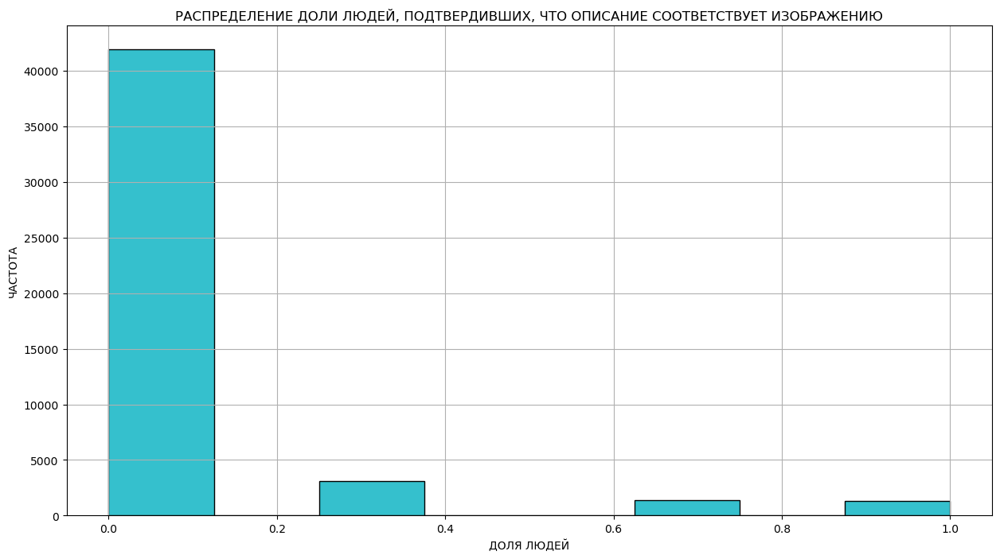

In [15]:
hist_graf(df_crowd['fraction'], 
          'ДОЛЯ ЛЮДЕЙ, ПОДТВЕРДИВШИХ, ЧТО ОПИСАНИЕ СООТВЕТСТВУЕТ ИЗОБРАЖЕНИЮ', 
          'РАСПРЕДЕЛЕНИЕ ДОЛИ ЛЮДЕЙ, ПОДТВЕРДИВШИХ, ЧТО ОПИСАНИЕ СООТВЕТСТВУЕТ ИЗОБРАЖЕНИЮ', 
          'ЧАСТОТА', 
          'ДОЛЯ ЛЮДЕЙ', 
          8)

В основном красудсорсеры считают, что описание не соответствует изображению.

Посмотрим, как распределены оценки экспертов в данных.

In [16]:
first_exp = df_expert[['first_exp']].rename(columns={'first_exp':'mark'})
first_exp['exp_No'] = 'first'
second_exp = df_expert[['second_exp']].rename(columns={'second_exp':'mark'})
second_exp['exp_No'] = 'second'
third_exp = df_expert[['third_exp']].rename(columns={'third_exp':'mark'})
third_exp['exp_No'] = 'third'
all_exp = pd.concat([first_exp,second_exp,third_exp])
all_exp = all_exp.groupby(['exp_No','mark']).size().reset_index(name='count')

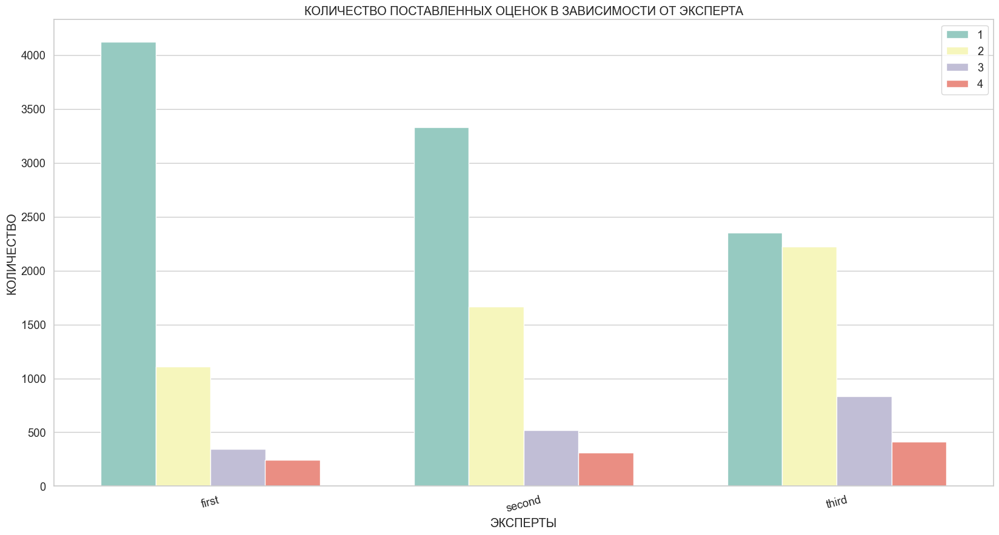

In [17]:
manybars(all_exp, 'exp_No', 'count', 'mark', 'КОЛИЧЕСТВО', 'ЭКСПЕРТЫ',  
          'КОЛИЧЕСТВО ПОСТАВЛЕННЫХ ОЦЕНОК В ЗАВИСИМОСТИ ОТ ЭКСПЕРТА', 1, 1, 0.7)

Все эксперты чаще ставят оценку 1, что означает полное несоответствие описания изображению. Чаще остальных оценку 1 ставит первых эксперт. Его оценки очень похожи на предыдущий график распределения с краудсорсерами. Третий эксперт чаще остальных ставит оценку 2, 3 и 4. Однако, по графику видно, что в основном, все три эксперта оценивают соответствие описания и изображения на оценки 1 и 2.

### Формирование единого датасета

Для дальнейшей работы нужно получить одну таблицу со всеми необходимыми данными и одной системой оценивания. Итоговая таблица должна содержать следующие столбцы:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **query_text** - описание изображения;
* **оценка** - оценка соответствия описания изображению.

Нам необходимо выбрать: либо мы добавляем в данные экспертные оценки, либо краудсорсинговые. Либо объединяем каким-то образом эти оценки в одну. Вероятнее всего, экспертные оценки точнее, чем краудсорсинговые. Обычно исполнители очень разные: кто-то может выполнять задачи более ответственно, а кто-то чаще допускать ошибки.

У нас есть возможность провести небольшой тест и проверить, какие оценки точнее. В названии id столбца **query_id** содержится имя файла изображения, к которому изначально было дано описание. Добавим порядковый номер описания к названиям изображений в столбце **image** датасета с оценками краудсорсеров. Посмотрим, сколько полученных названий изображений совпадёт с названием в столбце **query_id**, но при этом оценка будет низкая.

In [18]:
len(df_crowd[(df_crowd['image'].apply(lambda x: x + '#2') == df_crowd['query_id']) & (df_crowd['fraction'] < 0.7)])

164

164 изображения имеют точное описание, однако доля людей, которые согласны с этим - меньше 0.7. Теперь создадим аналогичный запрос для экспертной оценки. Для этого найдём медианного значение оценок всех экспертов и приведём оценки экспертов к диапазону от 0 до 1.

In [19]:
df_expert['total_exp'] = (df_expert[['first_exp', 'second_exp', 'third_exp']]).median(axis=1)
df_expert['total_exp'] = (df_expert['total_exp'] - df_expert['total_exp'].min()) / (df_expert['total_exp'].max() - df_expert['total_exp'].min()) 

In [20]:
len(df_expert[(df_expert['image'].apply(lambda x: x + '#2') == df_expert['query_id']) & (df_expert['total_exp'] < 0.7)])

2

При тех же условиях ошиблись только 2 эксперта. Значит, больше будем отталкиваться от оценок экспертов.

Объединим датасеты **df_expert** и **df_crowd**, добавив данные из второй таблицы к первой.

In [21]:
df = pd.merge(df_expert[['image', 'query_id', 'total_exp']], df_crowd[['image', 'query_id', 'fraction']],
                          on=['image', 'query_id'], how='left')

In [22]:
df.head(3)

,image,query_id,total_exp,fraction
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.0,0.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.0,NaN


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      5822 non-null   object 
 1   query_id   5822 non-null   object 
 2   total_exp  5822 non-null   float64
 3   fraction   2329 non-null   float64
dtypes: float64(2), object(2)
memory usage: 182.1+ KB


In [24]:
df.isna().sum()

image           0
query_id        0
total_exp       0
fraction     3493
dtype: int64

Пропущенные значения в столбце **fraction** заменим на значения из столбца **total_exp**.

In [25]:
df['fraction'] = df['fraction'].fillna(df['total_exp'])

In [26]:
df.isna().sum()

image        0
query_id     0
total_exp    0
fraction     0
dtype: int64

Объединим датафреймы **df** и **df_train**.

In [27]:
df = pd.merge(df, df_train[['image', 'query_id', 'query_text']], on=['image', 'query_id'])

In [28]:
df.isna().sum()

image         0
query_id      0
total_exp     0
fraction      0
query_text    0
dtype: int64

Сложим оценки краудсорсеров и экспертов, добавив веса.

In [29]:
df['mark'] = round(df['total_exp']*0.7 + df['fraction']*0.3, 2)
df = df.drop(columns=['total_exp', 'fraction'])

In [30]:
df.head()

,image,query_id,query_text,mark
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.00
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.00
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.00
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,0.33
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.00


In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   mark        5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


Таблица с итоговой оценкой получена.

### Вывод

На этапе исследовательского анализа данных мы **подготовились к работе**: импортировали необходимые библиотеки, построили функции для визуализации данных, задали константы. Далее **загрузили** входные данные. Нам было предоставлено 5 датасетов и 2 папки с изображениями. **Проанализировали** информацию в датасетах.

В датасете **df_train** собрана информация, необходимая для обучения. Для одной картинки может быть доступно до 5 описаний. 

Датасет содержит 5822 строк и 3 столбца:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **query_text** - текст описания.

Количество уникальных изображений в датафрейме - 1000, а текстов - 977. Пропущенные значения и полные дубликаты не найдены. 

В датасете **df_test_query** находится информация, необходимая для тестирования. 

Датасет содержит 500 строк и 3 столбца:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **query_text** - текст описания.

Количество уникальных изображений в датафрейме - 100, а текстов - 500. Пропущенные значения и полные дубликаты не найдены.

В датасете **df_test_images** содержатся изображения для тестирования модели. 

В датасете **df_crowd** находятся данные по соответствию изображения и описания, полученные с помощью краудсорсинга.

Датасет содержит 47830 строк и 5 столбцов:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **fraction** - доля людей, подтвердивших, что описание соответствует изображению;
* **respond** - количество человек, подтвердивших, что описание соответствует изображению;
* **no_respond** - количество человек, подтвердивших, что описание не соответствует изображению.

Средняя оценка в столбце  **fraction** - 0.069. То есть люди, в основном, сомневаются в соответствии запросов изображениям.  В столбце  **respond** шкала значений от 0 до 5. В основном встречается значение 0. В столбце  **no_respond** шкала значений от 0 до 6. В основном - 3. 

Пропущенные значения и полные дубликаты в датасете не найдены.

В датасете **df_expert** содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов.

Датасет содержит 5822 строк и 5 столбцов:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **first_exp** - оценка 1-го эксперта;
* **second_exp** - оценка 2-го эксперта;
* **third_exp** - оценка 3-го эксперта.

Эксперты ставят оценки по шкале от 1 до 4, где:
* 1 — изображение и запрос совершенно не соответствуют друг другу, 
* 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 
* 3 — запрос и текст соответствуют с точностью до некоторых деталей, 
* 4 — запрос и текст соответствуют полностью.

Большая часть данных получила оценки 1 или 2.
Пропущенные значения и полные дубликаты не найдены.

В датасетах с оценками дубликатов не найдено. Получается, что в датасете с краудсорсингом больше информации, чем в датасете с экспертными оценками (47830 строк против 5822).

В некоторых странах поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию о детях до 16 лет. В датасетах есть изображения, которые нарушают данный закон. Такие изображения нужно будет удалить. 

Далее мы перешли к **визуализации данных**. Построили график распределения доли краудсорсеров, подтвердивших, что описание соответствует изображению. В основном красудсорсеры считают, что описание не соответствует изображению. Три эксперта также чаще ставят оценку 1. Чаще остальных оценку 1 ставит первый эксперт. Его оценки очень похожи на график распределения с краудсорсерами. Третий эксперт чаще остальных ставит оценку 2, 3 и 4. Однако, по графику видно, что в основном, все три эксперта оценивают соответствие описания и изображения на оценки 1 и 2.

## Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Создадим словарь слов, которые описывают изображения, попадающие под законодательные ограничения.

In [32]:
bad_words = ['kid','newborn', 'baby', 'child', 'children', 'teenager', 'girl', 'girls', 'boy', 'boys', 'youth', 'adolescent', 
             'juvenile','youngster', 'young', 'babyhood', 'infancy', 'infant', 'neonate', 'toddler','family']

Пропишем функцию, которая определит, что в описании присутствует слово из словаря **bad_words**

In [33]:
def bad_text(string, bad_words):
    lst = string.split(' ')
    if len(set(lst).intersection(set(bad_words))) != 0:
        bad_text = string
    else:
        bad_text = np.nan
    return bad_text

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   mark        5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


In [35]:
bad_text = df['query_text'].apply(lambda x: bad_text(x, bad_words)).dropna()
df_bad_text = df[df['query_text'].isin(bad_text)]

In [36]:
df_bad_text['query_id'] = df_bad_text['query_id'].map(lambda x: str(x)[:-2])
image_del = df_bad_text['query_id'].unique()

Проверим, что исключаются действительно изображения с детьми.

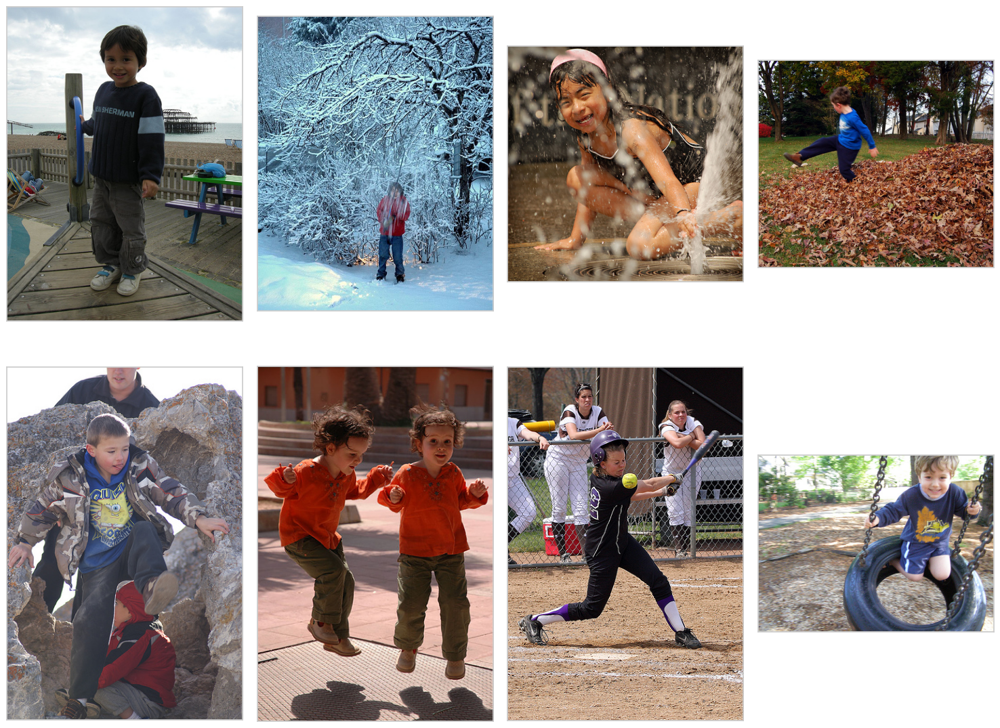

In [37]:
bad_image_del = df[df['image'].isin(image_del) == True]
data = list(bad_image_del['image'].sample(8, random_state = RANDOM_STATE))
fig = plt.figure(figsize=(15, 15))
for i in range(8):
    fig.add_subplot(2, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', data[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

Отлично. Всё работает. Исключим изображения с детьми.

In [38]:
df = df[df['image'].isin(image_del) == False]

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4131 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4131 non-null   object 
 1   query_id    4131 non-null   object 
 2   query_text  4131 non-null   object 
 3   mark        4131 non-null   float64
dtypes: float64(1), object(3)
memory usage: 161.4+ KB


Исключили 1684 изображения.

### Вывод

На данном этапе был создан словарь слов, которые могли бы указывать на наличие ребёнка на изображении. Далее мы прописали функцию, которая определяет, что в описании присутствует слово из данного словаря и исключили изображения с детьми из сформированного на прошлом этапе датасета. Это позволит не нарушать закон, который существует в некоторых странах, где работает компания.

## Векторизация

### Векторизация изображений

Перед обучением и текст, и изображения нужно векторизовать. Векторизуем изображения с помощью архитектуры ResNet-18.

Создадим отдельный датасет с названиями изображений и их векторным представлением.

In [40]:
image_vect = pd.DataFrame(df['image'].unique(), columns=['image'])

In [41]:
image_vect.head(5)

,image
0,1056338697_4f7d7ce270.jpg
1,1082379191_ec1e53f996.jpg
2,1084040636_97d9633581.jpg
3,1107246521_d16a476380.jpg
4,1119015538_e8e796281e.jpg


Создадим функцию для получения эмбэдингов.

In [42]:
def vector(data):
    data = pd.DataFrame(data.image.unique(), columns=['image'])
    vectors = []
    for i in tqdm(data['image']):
        try:
            image = Image.open(Path(PATH, 'train_images', i))
        except:
            image = Image.open(Path(PATH, 'test_images', i))
        image_tensor = preprocess(image)
        tensor = pd.Series(resnet(image_tensor.unsqueeze(0)).flatten().numpy())
        vectors.append(tensor)

    data = pd.concat([data, pd.DataFrame(vectors)], axis=1)
    return data

In [43]:
resnet = models.resnet18(pretrained=True)

Нам не потребуется обучать модель, поэтому заморозим веса.

In [44]:
for param in resnet.parameters():
    param.requires_grad_(False)

Возьмём все слои, кроме последнего и переведём изображения в нужный формат.

In [45]:
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules) 

In [46]:
resnet.eval() 

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

In [47]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
preprocess = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(224), transforms.ToTensor(), norm]) 

In [48]:
image_vect = vector(df)

100%|████████████████████████████████████████████████████████████████████████████████| 717/717 [00:35<00:00, 20.33it/s]


In [49]:
image_vect.head(5)

,image,0,1,2,3,4,5,6,7,8,...,502,503,504,505,506,507,508,509,510,511
0,1056338697_4f7d7ce270.jpg,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,0.826550,1.108058,0.169696,...,0.444238,0.717754,0.294678,0.728789,1.153812,0.750846,1.196695,0.085011,1.056858,0.098236
1,1082379191_ec1e53f996.jpg,0.580882,0.636027,1.235305,1.239307,1.264694,0.385739,0.521414,1.737713,0.354155,...,0.707460,0.972236,0.291919,1.237114,0.270918,0.241003,0.039484,0.229986,2.469594,0.110243
2,1084040636_97d9633581.jpg,0.891785,0.699768,0.743491,0.213386,1.508289,1.159896,1.463326,3.576004,0.260950,...,1.121152,0.670595,0.416134,2.027011,0.029152,0.080594,1.536912,0.533676,1.394792,0.070406
3,1107246521_d16a476380.jpg,1.173782,1.277593,1.220057,0.511006,1.628965,0.791934,0.256380,0.031555,0.556466,...,0.672687,0.696745,0.368280,1.062172,0.204912,0.822552,0.092431,1.479730,0.760468,0.132308
4,1119015538_e8e796281e.jpg,0.868181,0.421632,0.035825,0.204046,0.285495,0.197902,0.847773,0.728671,1.442089,...,0.510151,0.548297,0.028085,0.964417,1.442034,0.544693,0.352939,1.391845,0.590310,0.168133


In [50]:
image_vect.isna().sum()

image    0
0        0
1        0
2        0
3        0
        ..
507      0
508      0
509      0
510      0
511      0
Length: 513, dtype: int64

Получен датасет с векторным представлением изображений.

### Векторизация текстов

Перейдём к векторизации текстов описаний. Пропишем функцию для векторизации текстов.

In [51]:
def vector_text(txt):
    tokens = tokenizer(txt, return_tensors='pt')
    with torch.no_grad():
        outputs = model_bert(**tokens)    
        outputs = outputs.last_hidden_state.mean(dim=1).squeeze().numpy()
    return outputs

Инициализируем токенизатор.

In [52]:
tokenizer=BertTokenizer.from_pretrained('bert-base-uncased')
model_bert = BertModel.from_pretrained('bert-base-uncased')

Отберём уникальные тексты, чтобы ускорить процесс векторизации.

In [53]:
df_unic_txt = pd.DataFrame(df['query_text'].unique(), columns=['query_text'])

Векторизуем тексты.

In [54]:
df_unic_txt['query_text_vector'] = df_unic_txt['query_text'].progress_apply(vector_text)

100%|████████████████████████████████████████████████████████████████████████████████| 939/939 [01:03<00:00, 14.73it/s]


Полученный список векторов раскидаем по столбцам, объединим описания и вектора к ним.

In [55]:
df_list = pd.DataFrame(df_unic_txt.query_text_vector.tolist())
df_unic_txt = pd.concat([df_unic_txt, df_list], axis=1)
df_unic_txt = df_unic_txt.drop(columns=['query_text_vector'])

In [56]:
df_unic_txt.head(3)

,query_text,0,1,2,3,4,5,6,7,8,...,758,759,760,761,762,763,764,765,766,767
0,A young child is wearing blue goggles and sitt...,0.219681,-0.143407,0.013692,0.163745,0.529185,-0.484684,-0.033610,0.683689,-0.097431,...,-0.516457,-0.201560,-0.493887,0.013434,-0.006957,-0.036319,0.237775,-0.176095,-0.013142,0.204745
1,A girl wearing a yellow shirt and sunglasses s...,0.501098,-0.245353,-0.134886,-0.144165,0.393156,-0.337638,0.014105,0.679082,0.014595,...,-0.638044,-0.129320,-0.044413,-0.062804,-0.202447,-0.078268,0.182695,-0.169717,0.003194,0.136546
2,A man sleeps under a blanket on a city street .,0.495474,-0.220371,0.151327,0.021881,0.227644,0.036066,-0.071937,0.897265,-0.020503,...,0.199519,-0.168477,-0.130826,0.050840,0.137441,0.234321,0.040068,-0.390364,0.070866,0.154538


In [57]:
df_unic_txt.isna().sum()

query_text    0
0             0
1             0
2             0
3             0
             ..
763           0
764           0
765           0
766           0
767           0
Length: 769, dtype: int64

Получен датасет с векторами текстов.

### Объединение векторов

Объедините векторы изображений и векторы текстов.

Наименования столбцов с векторными данными имеют числовое значение. Переименуем столбцы датафреймов с векторами изображений и текстов.

In [58]:
image_vect.columns = ['image' if str(column) == 'image' else str(column) + '_image' for column in image_vect.columns]
df_unic_txt.columns = ['query_text' if str(column) == 'query_text' else str(column) + '_text' for column in df_unic_txt.columns]

Присоединим датафрейм с векторами изображений к основному датафрейму **df**.

In [59]:
df_itog = (df.merge(image_vect, on='image', how='left'))

In [60]:
df_itog.head(3)

,image,query_id,query_text,mark,0_image,1_image,2_image,3_image,4_image,5_image,...,502_image,503_image,504_image,505_image,506_image,507_image,508_image,509_image,510_image,511_image
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,...,0.444238,0.717754,0.294678,0.728789,1.153812,0.750846,1.196695,0.085011,1.056858,0.098236
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.0,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,...,0.444238,0.717754,0.294678,0.728789,1.153812,0.750846,1.196695,0.085011,1.056858,0.098236
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.0,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,...,0.444238,0.717754,0.294678,0.728789,1.153812,0.750846,1.196695,0.085011,1.056858,0.098236


Также объединим полученный датафрейм **df_itog** и датафрейм **df_unic_txt**.

In [61]:
df_itog = df_itog.merge(df_unic_txt, on='query_text', how='left')

In [62]:
df_itog.head(3)

,image,query_id,query_text,mark,0_image,1_image,2_image,3_image,4_image,5_image,...,758_text,759_text,760_text,761_text,762_text,763_text,764_text,765_text,766_text,767_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,...,-0.516457,-0.201560,-0.493887,0.013434,-0.006957,-0.036319,0.237775,-0.176095,-0.013142,0.204745
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.0,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,...,-0.638044,-0.129320,-0.044413,-0.062804,-0.202447,-0.078268,0.182695,-0.169717,0.003194,0.136546
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.0,0.693981,3.031816,2.916986,0.951921,0.936226,1.245219,...,0.199519,-0.168477,-0.130826,0.050840,0.137441,0.234321,0.040068,-0.390364,0.070866,0.154538


In [63]:
df_itog.isna().sum()

image         0
query_id      0
query_text    0
mark          0
0_image       0
             ..
763_text      0
764_text      0
765_text      0
766_text      0
767_text      0
Length: 1284, dtype: int64

In [64]:
df_itog.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4131 entries, 0 to 4130
Columns: 1284 entries, image to 767_text
dtypes: float32(1280), float64(1), object(3)
memory usage: 20.3+ MB


Единый датафрейм для дальнейшего обучения получен. Всего получилось 1284 столбца. Из них 1280 - это векторное представление изображений (512 столбцов) и описаний (768 столбцов).

### Вывод

На данном этапе перешли к **векторизации** текста и изображений. Для ускорения процесса были отобраны только уникальные изображения и описания. Изображения векторизовали с помощью архитектуры **ResNet-18**. Для векторизации текста загрузили предобученную модель **BERT**. На выходе было получено два датафрейма:
* с векторным представлением изображений;
* с векторным представлением описаний.


Датафреймы **объединили** для дальнейшего обучения. Всего получилось 1284 столбца. Из них 1280 - это векторное представление изображений (512 столбцов) и описаний (768 столбцов).


## Обучение модели 
Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

### Подготовка к обучению

Разделим итоговый датафрейм на обучающую и валидационную выборки. Чтобы исключить попадание изображения  и в обучающую, и в тестовую выборки воспользуемся классом **GroupShuffleSplit**.

In [65]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=RANDOM_STATE)
train_indices, test_indices = next(gss.split(X=df_itog.drop(columns=['mark']), y=df_itog['mark'], groups=df_itog['image']))
train_df, val_df = df_itog.loc[train_indices], df_itog.loc[test_indices]

In [66]:
print(train_df.shape, val_df.shape)

(3297, 1284) (834, 1284)


Отделим от выборок целевой признак **mark**. 

In [67]:
x_train = train_df.drop(columns=['mark','query_text','image', 'query_id'])
y_train = train_df['mark']
x_val = val_df.drop(columns=['mark','query_text','image', 'query_id'])
y_val = val_df['mark']

In [68]:
x_train.head(3)

,0_image,1_image,2_image,3_image,4_image,5_image,6_image,7_image,8_image,9_image,...,758_text,759_text,760_text,761_text,762_text,763_text,764_text,765_text,766_text,767_text
8,0.580882,0.636027,1.235305,1.239307,1.264694,0.385739,0.521414,1.737713,0.354155,0.216855,...,-0.184694,-0.253309,-0.298532,0.073137,-0.206071,0.149392,0.182364,-0.306995,-0.023602,0.039893
9,0.580882,0.636027,1.235305,1.239307,1.264694,0.385739,0.521414,1.737713,0.354155,0.216855,...,0.202227,-0.545613,0.188574,-0.080905,-0.076970,0.034245,0.158137,-0.290418,-0.063322,-0.193492
10,0.580882,0.636027,1.235305,1.239307,1.264694,0.385739,0.521414,1.737713,0.354155,0.216855,...,-0.149459,-0.354068,-0.108529,-0.068272,0.142740,0.438373,0.414000,-0.202802,-0.117140,0.145954


In [69]:
y_train.head(3)

8     0.00
9     0.23
10    0.00
Name: mark, dtype: float64

В качестве обучения исследуем две модели:
* **Линейная регрессия**
* **Полносвязная нейронная сеть**

В качестве метрики возьмём **RMSE**. Это позволит ускорить процесс обучения нейронной сети.

### Обучение модели

Для начала обучим простейшую модель DummyRegressor. Так мы получим контрольные данные для сравнительной оценки более сложных моделей.

In [70]:
model_DR = DummyRegressor(strategy='mean')

model_DR.fit(x_train, y_train)
predictions_DR = model_DR.predict(x_val)

rmse_DR = np.sqrt(mean_squared_error(y_val, predictions_DR))

print('Значение метрики RMSE:', rmse_DR)

Значение метрики RMSE: 0.2953044845683555


Обученная модель должна превзойти выданное значение.

Получим значение метрики при обучении **линейной регрессии**. Перед обучением отмасштабируем признаки.

In [71]:
scaler = StandardScaler()

In [72]:
x_train_LR = scaler.fit_transform(x_train)
x_val_LR = scaler.transform(x_val)

In [73]:
x_train_LR

array([[-0.1280893 , -0.4654406 ,  0.5514732 , ..., -0.58368874,
        -0.26758522,  0.15175249],
       [-0.1280893 , -0.4654406 ,  0.5514732 , ..., -0.48204735,
        -0.5092293 , -1.1529511 ],
       [-0.1280893 , -0.4654406 ,  0.5514732 , ...,  0.05517732,
        -0.83663076,  0.7446683 ],
       ...,
       [ 1.7710668 , -0.5733269 , -0.4447192 , ...,  0.07340604,
         0.50059766,  0.73375404],
       [ 1.7710668 , -0.5733269 , -0.4447192 , ...,  0.38471633,
         0.1791602 , -0.27374774],
       [ 1.7710668 , -0.5733269 , -0.4447192 , ..., -0.11587663,
         0.829646  ,  0.95408314]], dtype=float32)

In [74]:
x_val_LR

array([[ 0.04300645,  2.1666164 ,  2.9936101 , ...,  0.21892908,
        -0.20395434,  1.073327  ],
       [ 0.04300645,  2.1666164 ,  2.9936101 , ...,  0.25803873,
        -0.10457519,  0.69207454],
       [ 0.04300645,  2.1666164 ,  2.9936101 , ..., -1.0948716 ,
         0.30711287,  0.79265326],
       ...,
       [ 0.23206562, -0.38643804,  0.24356642, ..., -2.1411362 ,
        -0.9600971 , -2.2851148 ],
       [ 0.23206562, -0.38643804,  0.24356642, ..., -1.4245012 ,
         0.37098616,  0.1654477 ],
       [ 0.23206562, -0.38643804,  0.24356642, ..., -0.18577667,
         0.08063754, -0.0328924 ]], dtype=float32)

In [75]:
model_LR = LinearRegression()

model_LR.fit(x_train_LR, y_train)
predictions_LR = model_LR.predict(x_val_LR)
rmse_LR = np.sqrt(mean_squared_error(y_val, predictions_LR))

print('Значение метрики RMSE:', rmse_LR)

Значение метрики RMSE: 0.46014601619010903


Построим последовательную архитектуру нейронной сети из 9-ти слоёв. Будем использовать такие активаторы как ELU, tanh, relu и, на последнем слое, sigmoid. Для предупреждения переобучения возьмём несколько методов: обнуление некоторых выходов с помощью dropout и регуляризацию. В качестве оптимизатора возьмём Adam.

In [76]:
def model():
    model = Sequential()
    model.add(Dense(1024, input_shape=(1280,)))
    model.add(ELU(alpha=0.01))
    model.add(Dropout(0.2))
    model.add(Dense(512, kernel_regularizer=regularizers.l2(0.001), activation='tanh'))
    model.add(Dropout(0.2))
    model.add(Dense(512, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(512, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(256, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(256, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(256, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(64, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer=Adam(learning_rate=0.0001), 
                  loss='mean_squared_error', 
                  metrics=[RootMeanSquaredError()])
    return model

Обучим модель.

In [77]:
model_S =  model()
model_S.fit(x_train, y_train, epochs=1000, batch_size=28, validation_data=(x_val, y_val), 
            validation_steps=math.ceil(x_train.shape[1] / 28), verbose=1        
)
loss = nn.MSELoss()

Epoch 1/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 2.6464 - root_mean_squared_error: 0.3140 - val_loss: 2.1863 - val_root_mean_squared_error: 0.2926
Epoch 2/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 2.1316 - root_mean_squared_error: 0.2714 - val_loss: 1.7572 - val_root_mean_squared_error: 0.2857
Epoch 3/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 1.7090 - root_mean_squared_error: 0.2625 - val_loss: 1.4149 - val_root_mean_squared_error: 0.2903
Epoch 4/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 1.3677 - root_mean_squared_error: 0.2557 - val_loss: 1.1409 - val_root_mean_squared_error: 0.2937
Epoch 5/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 1.0932 - root_mean_squared_error: 0.2459 - val_loss: 0.9131 - val_root_mean_squared_error: 0.2782
Epoch 6/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.8743 - root_mean_squared_error: 0.2353 - val_loss: 0.7353 - val_root_mean_squared_error: 0.2702
Epoch 7/1000
118/118 ━━━━━━━━━━━━━

Epoch 43/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0251 - root_mean_squared_error: 0.1239 - val_loss: 0.0678 - val_root_mean_squared_error: 0.2465
Epoch 44/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0246 - root_mean_squared_error: 0.1231 - val_loss: 0.0692 - val_root_mean_squared_error: 0.2495
Epoch 45/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0241 - root_mean_squared_error: 0.1209 - val_loss: 0.0697 - val_root_mean_squared_error: 0.2509
Epoch 46/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0227 - root_mean_squared_error: 0.1156 - val_loss: 0.0728 - val_root_mean_squared_error: 0.2572
Epoch 47/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0225 - root_mean_squared_error: 0.1154 - val_loss: 0.0658 - val_root_mean_squared_error: 0.2429
Epoch 48/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0218 - root_mean_squared_error: 0.1126 - val_loss: 0.0681 - val_root_mean_squared_error: 0.2478
Epoch 49/1000
118/118 ━━━━━━

Epoch 85/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0159 - root_mean_squared_error: 0.0899 - val_loss: 0.0674 - val_root_mean_squared_error: 0.2494
Epoch 86/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0162 - root_mean_squared_error: 0.0923 - val_loss: 0.0678 - val_root_mean_squared_error: 0.2498
Epoch 87/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0160 - root_mean_squared_error: 0.0909 - val_loss: 0.0667 - val_root_mean_squared_error: 0.2475
Epoch 88/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0156 - root_mean_squared_error: 0.0891 - val_loss: 0.0637 - val_root_mean_squared_error: 0.2415
Epoch 89/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0156 - root_mean_squared_error: 0.0889 - val_loss: 0.0636 - val_root_mean_squared_error: 0.2415
Epoch 90/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0159 - root_mean_squared_error: 0.0907 - val_loss: 0.0626 - val_root_mean_squared_error: 0.2393
Epoch 91/1000
118/118 ━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0122 - root_mean_squared_error: 0.0749 - val_loss: 0.0620 - val_root_mean_squared_error: 0.2403
Epoch 168/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0120 - root_mean_squared_error: 0.0735 - val_loss: 0.0628 - val_root_mean_squared_error: 0.2419
Epoch 169/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0125 - root_mean_squared_error: 0.0771 - val_loss: 0.0612 - val_root_mean_squared_error: 0.2388
Epoch 170/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0127 - root_mean_squared_error: 0.0782 - val_loss: 0.0673 - val_root_mean_squared_error: 0.2511
Epoch 171/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0127 - root_mean_squared_error: 0.0781 - val_loss: 0.0620 - val_root_mean_squared_error: 0.2402
Epoch 172/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0119 - root_mean_squared_error: 0.0733 - val_loss: 0.0626 - val_root_mean_squared_error: 0.2414
Epoch 173/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0112 - root_mean_squared_error: 0.0722 - val_loss: 0.0622 - val_root_mean_squared_error: 0.2418
Epoch 250/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0109 - root_mean_squared_error: 0.0699 - val_loss: 0.0632 - val_root_mean_squared_error: 0.2439
Epoch 251/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0113 - root_mean_squared_error: 0.0732 - val_loss: 0.0613 - val_root_mean_squared_error: 0.2401
Epoch 252/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0114 - root_mean_squared_error: 0.0741 - val_loss: 0.0640 - val_root_mean_squared_error: 0.2455
Epoch 253/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0111 - root_mean_squared_error: 0.0711 - val_loss: 0.0626 - val_root_mean_squared_error: 0.2429
Epoch 254/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0109 - root_mean_squared_error: 0.0699 - val_loss: 0.0613 - val_root_mean_squared_error: 0.2398
Epoch 255/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0108 - root_mean_squared_error: 0.0714 - val_loss: 0.0606 - val_root_mean_squared_error: 0.2393
Epoch 332/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0102 - root_mean_squared_error: 0.0683 - val_loss: 0.0615 - val_root_mean_squared_error: 0.2410
Epoch 333/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0104 - root_mean_squared_error: 0.0692 - val_loss: 0.0598 - val_root_mean_squared_error: 0.2377
Epoch 334/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0105 - root_mean_squared_error: 0.0700 - val_loss: 0.0631 - val_root_mean_squared_error: 0.2444
Epoch 335/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0101 - root_mean_squared_error: 0.0671 - val_loss: 0.0606 - val_root_mean_squared_error: 0.2395
Epoch 336/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0103 - root_mean_squared_error: 0.0692 - val_loss: 0.0615 - val_root_mean_squared_error: 0.2410
Epoch 337/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0099 - root_mean_squared_error: 0.0677 - val_loss: 0.0644 - val_root_mean_squared_error: 0.2477
Epoch 414/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0102 - root_mean_squared_error: 0.0701 - val_loss: 0.0629 - val_root_mean_squared_error: 0.2446
Epoch 415/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0100 - root_mean_squared_error: 0.0685 - val_loss: 0.0607 - val_root_mean_squared_error: 0.2400
Epoch 416/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0097 - root_mean_squared_error: 0.0664 - val_loss: 0.0627 - val_root_mean_squared_error: 0.2444
Epoch 417/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0098 - root_mean_squared_error: 0.0676 - val_loss: 0.0597 - val_root_mean_squared_error: 0.2381
Epoch 418/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0098 - root_mean_squared_error: 0.0672 - val_loss: 0.0599 - val_root_mean_squared_error: 0.2385
Epoch 419/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0092 - root_mean_squared_error: 0.0645 - val_loss: 0.0609 - val_root_mean_squared_error: 0.2412
Epoch 496/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0094 - root_mean_squared_error: 0.0663 - val_loss: 0.0602 - val_root_mean_squared_error: 0.2395
Epoch 497/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0098 - root_mean_squared_error: 0.0686 - val_loss: 0.0604 - val_root_mean_squared_error: 0.2400
Epoch 498/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0094 - root_mean_squared_error: 0.0658 - val_loss: 0.0599 - val_root_mean_squared_error: 0.2388
Epoch 499/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0095 - root_mean_squared_error: 0.0665 - val_loss: 0.0615 - val_root_mean_squared_error: 0.2424
Epoch 500/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0095 - root_mean_squared_error: 0.0670 - val_loss: 0.0646 - val_root_mean_squared_error: 0.2487
Epoch 501/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0091 - root_mean_squared_error: 0.0655 - val_loss: 0.0600 - val_root_mean_squared_error: 0.2394
Epoch 578/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0093 - root_mean_squared_error: 0.0653 - val_loss: 0.0610 - val_root_mean_squared_error: 0.2414
Epoch 579/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0090 - root_mean_squared_error: 0.0642 - val_loss: 0.0620 - val_root_mean_squared_error: 0.2438
Epoch 580/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0091 - root_mean_squared_error: 0.0659 - val_loss: 0.0642 - val_root_mean_squared_error: 0.2483
Epoch 581/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0086 - root_mean_squared_error: 0.0611 - val_loss: 0.0613 - val_root_mean_squared_error: 0.2423
Epoch 582/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0089 - root_mean_squared_error: 0.0642 - val_loss: 0.0617 - val_root_mean_squared_error: 0.2432
Epoch 583/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0091 - root_mean_squared_error: 0.0671 - val_loss: 0.0611 - val_root_mean_squared_error: 0.2422
Epoch 660/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0085 - root_mean_squared_error: 0.0623 - val_loss: 0.0608 - val_root_mean_squared_error: 0.2416
Epoch 661/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0085 - root_mean_squared_error: 0.0626 - val_loss: 0.0609 - val_root_mean_squared_error: 0.2417
Epoch 662/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0089 - root_mean_squared_error: 0.0652 - val_loss: 0.0635 - val_root_mean_squared_error: 0.2472
Epoch 663/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0089 - root_mean_squared_error: 0.0652 - val_loss: 0.0613 - val_root_mean_squared_error: 0.2428
Epoch 664/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0082 - root_mean_squared_error: 0.0602 - val_loss: 0.0601 - val_root_mean_squared_error: 0.2402
Epoch 665/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0091 - root_mean_squared_error: 0.0675 - val_loss: 0.0598 - val_root_mean_squared_error: 0.2397
Epoch 742/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0084 - root_mean_squared_error: 0.0624 - val_loss: 0.0597 - val_root_mean_squared_error: 0.2395
Epoch 743/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0084 - root_mean_squared_error: 0.0629 - val_loss: 0.0601 - val_root_mean_squared_error: 0.2401
Epoch 744/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0081 - root_mean_squared_error: 0.0600 - val_loss: 0.0585 - val_root_mean_squared_error: 0.2371
Epoch 745/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0085 - root_mean_squared_error: 0.0638 - val_loss: 0.0592 - val_root_mean_squared_error: 0.2386
Epoch 746/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0084 - root_mean_squared_error: 0.0625 - val_loss: 0.0616 - val_root_mean_squared_error: 0.2437
Epoch 747/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0079 - root_mean_squared_error: 0.0595 - val_loss: 0.0585 - val_root_mean_squared_error: 0.2374
Epoch 824/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0081 - root_mean_squared_error: 0.0617 - val_loss: 0.0611 - val_root_mean_squared_error: 0.2427
Epoch 825/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0083 - root_mean_squared_error: 0.0629 - val_loss: 0.0632 - val_root_mean_squared_error: 0.2472
Epoch 826/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0082 - root_mean_squared_error: 0.0621 - val_loss: 0.0599 - val_root_mean_squared_error: 0.2402
Epoch 827/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0080 - root_mean_squared_error: 0.0605 - val_loss: 0.0597 - val_root_mean_squared_error: 0.2399
Epoch 828/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0085 - root_mean_squared_error: 0.0642 - val_loss: 0.0600 - val_root_mean_squared_error: 0.2405
Epoch 829/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0077 - root_mean_squared_error: 0.0592 - val_loss: 0.0580 - val_root_mean_squared_error: 0.2365
Epoch 906/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0081 - root_mean_squared_error: 0.0616 - val_loss: 0.0596 - val_root_mean_squared_error: 0.2401
Epoch 907/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0076 - root_mean_squared_error: 0.0580 - val_loss: 0.0604 - val_root_mean_squared_error: 0.2416
Epoch 908/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0078 - root_mean_squared_error: 0.0596 - val_loss: 0.0611 - val_root_mean_squared_error: 0.2428
Epoch 909/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0082 - root_mean_squared_error: 0.0620 - val_loss: 0.0575 - val_root_mean_squared_error: 0.2354
Epoch 910/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0084 - root_mean_squared_error: 0.0640 - val_loss: 0.0585 - val_root_mean_squared_error: 0.2375
Epoch 911/1000
118/118 ━━━━━━━━━━━━━━

118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0076 - root_mean_squared_error: 0.0585 - val_loss: 0.0622 - val_root_mean_squared_error: 0.2454
Epoch 988/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0078 - root_mean_squared_error: 0.0605 - val_loss: 0.0633 - val_root_mean_squared_error: 0.2478
Epoch 989/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0077 - root_mean_squared_error: 0.0596 - val_loss: 0.0618 - val_root_mean_squared_error: 0.2447
Epoch 990/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0077 - root_mean_squared_error: 0.0599 - val_loss: 0.0593 - val_root_mean_squared_error: 0.2395
Epoch 991/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0075 - root_mean_squared_error: 0.0577 - val_loss: 0.0613 - val_root_mean_squared_error: 0.2439
Epoch 992/1000
118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0078 - root_mean_squared_error: 0.0607 - val_loss: 0.0589 - val_root_mean_squared_error: 0.2388
Epoch 993/1000
118/118 ━━━━━━━━━━━━━━

Значение метрики RMSE полносвязной нейронной сети гораздо лучше, чем при обучении линейной регрессии. Поэтому для тестирования будем использовать нейронную сеть.

### Вывод

Полученный на прошлом этапе датасет разделили на обучающую и валидационную выборки в соотношении 80% на 20%. Чтобы исключить попадание изображения  и в обучающую, и в тестовую выборки воспользовались классом **GroupShuffleSplit**. Также целевой признак **mark** вынесли в отдельные датафреймы.
В качестве обучения исследовали две модели:
* **Линейная регрессия**
* **Полносвязная нейронная сеть**

В качестве метрики взяли **RMSE**. Это позволило ускорить процесс обучения нейронной сети.

Для начала обучили простейшую модель DummyRegressor. Получим контрольные данные для сравнительной оценки более сложных моделей.
**Обучили линейную регрессию** и **построили последовательную архитектуру нейронной сети** из 9 слоёв. Для нейронной сети использовали такие активаторы как ELU, tanh, relu и, на последнем слое, sigmoid. Для предупреждения переобучения использовали два метода: обнуление некоторых выходов с помощью dropout и регуляризацию. В качестве оптимизатора взяли Adam. Значение метрики RMSE гораздо лучше оказалось после обучения на нейронной сети. Далее, для тестирования, будем использовать её.

## Тестирование модели

### Подготовка к тестированию

Протестируем модель. Для этого получим эмбеддинги для всех тестовых изображений из папки test_images, выберим случайные 10 запросов из файла test_queries.csv и для каждого запроса выведим наиболее релевантное изображение. Сравним визуально качество поиска.

Создадим необходимые для тестирования функции.

In [78]:
# Функция вывода изображения

def show_image(image_path, mark, txt):
    print('Запрос:\n')
    print(txt)
    print('Вероятность попадания:', mark)
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    print()
    print()
    print()
    print() 

In [79]:
#Проверка описания, векторизация текста, тестирование модели.

def test_result(txt):
    if any(word in txt for word in bad_words):
        print('This image is unavailable in your country in compliance with local laws')
        print()
        print()
        print()
        print() 
        return
    
    txt_vector = vector_text(txt)
    df_test = pd.DataFrame([txt_vector])
    df_test = pd.concat([test_image_vect.drop(columns=['image']),
                        pd.concat([df_test] * len(test_image_vect), ignore_index=True)], axis=1)
    df_test_tensor = torch.tensor(df_test.values, dtype=torch.float32)
    test_preds = model_S.predict(df_test_tensor)
    best_score_id = np.argmax(test_preds)
    best_score = test_preds[best_score_id]
    best_img_name = test_image_vect['image'][best_score_id]
    best_image_path = os.path.join(image_path, best_img_name)
    show_image(best_image_path, best_score, txt)
    
    return 

Пропишем путь к папке с тестовыми изображениями.

In [80]:
image_path = PATH + 'test_images/'

Векторизуем изображения.

In [81]:
df_test_images.reset_index(inplace = True)

In [82]:
df_test_images.head(5)

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [83]:
test_image_vect = vector(df_test_images)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 13.33it/s]


In [84]:
test_image_vect.shape

(100, 513)

### Тестирование

Выберем случайные 10 запросов из файла test_queries.csv и для каждого запроса выведите наиболее релевантное изображение. Сравним визуально качество поиска.

In [85]:
random_txt = df_test_query.sample(n=10, random_state=RANDOM_STATE)
random_txt.reset_index(drop=True, inplace=True)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Запрос:

A dog is wearing jeans and a blue and yellow shirt with a black vehicle in the background .
Вероятность попадания: [0.29969606]


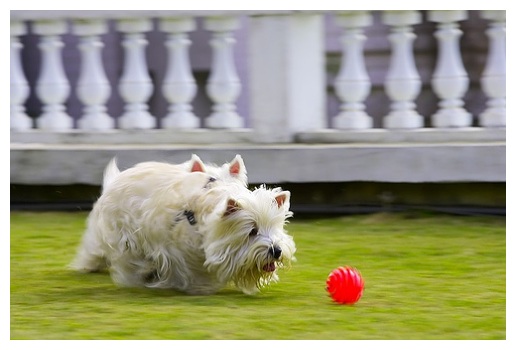





4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Запрос:

While holding tight to the ball , the man in red socks is getting tackled .
Вероятность попадания: [0.45669633]


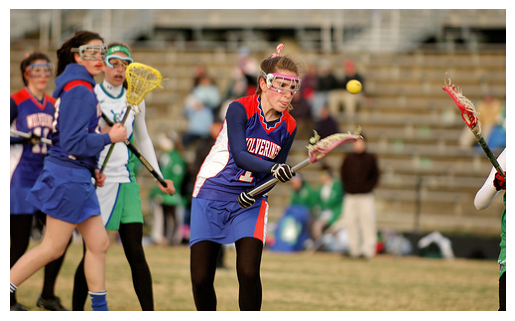





4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Запрос:

A dog is dressed in a shirt and pants on the side of the road .
Вероятность попадания: [0.4725806]


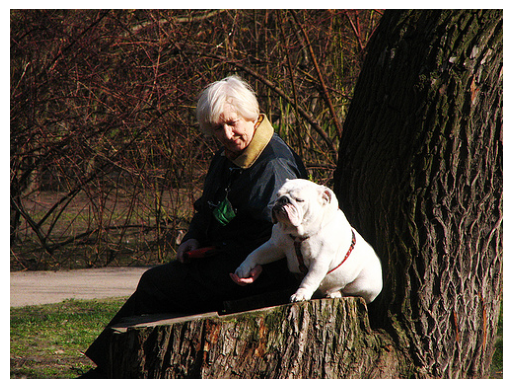





4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Запрос:

a biker rides down the street .
Вероятность попадания: [0.45403972]


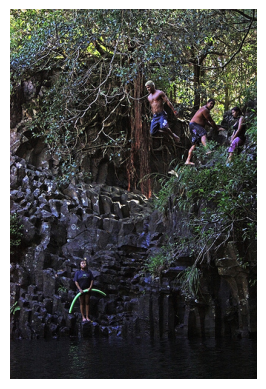





4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Запрос:

a kickboxer jumping for a kick
Вероятность попадания: [0.42434686]


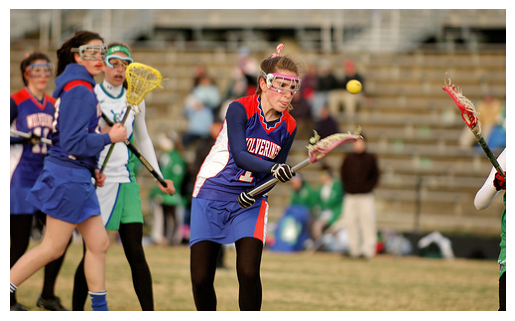





This image is unavailable in your country in compliance with local laws




This image is unavailable in your country in compliance with local laws




This image is unavailable in your country in compliance with local laws




This image is unavailable in your country in compliance with local laws




4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Запрос:

Three people are looking into photographic equipment .
Вероятность попадания: [0.42818633]


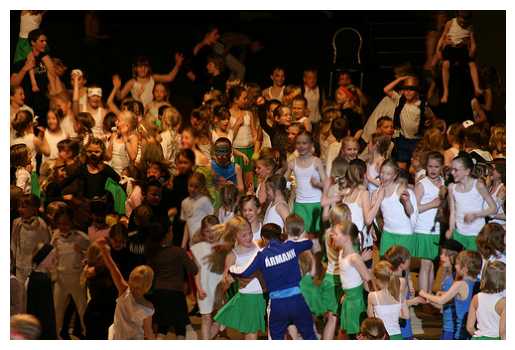

In [86]:
for i in range(len(random_txt)):
    test_result(random_txt['query_text'][i])

### Вывод

Протестировали демонстрационную нейронную сеть на тестовых данных. Выбрали случайные 10 запросов из файла test_queries.csv и для каждого запроса получили наиболее релевантное изображение. В целом, модель улавливет общую суть: если на изображении есть собака, то выведет собаку, если спорт, то будет нам спорт. Однако контекст модель пока понимать не научилась. Для улучшения модели можно попробовать увеличить количество слоёв и эпох (необходимы большие мощности, которые нам выделит начальство, когда мы убедим его, что задача решаема:)). Возможно, попробовать какую-нибудь предобученную модель.

## Общий вывод

Перед нами стояла **задача**: разработать демонстрационную версию поиска изображений по запросу.
По ссылке заказчик предоставил исходные данные. Задача была разбита на несколько этапов:
* **Исследовательский анализ данных**;
* **Проверка данных**;
* **Векторизация**;
* **Обучение модели**;
* **Тестирование**.

На этапе **исследовательского анализа данных** мы **подготовились к работе**: импортировали необходимые библиотеки, построили функции для визуализации данных, задали константы. Далее **загрузили** входные данные. Нам было предоставлено 5 датасетов и 2 папки с изображениями. **Проанализировали** информацию в датасетах.

В датасете **df_train** собрана информация, необходимая для обучения. Для одной картинки может быть доступно до 5 описаний. 

Датасет содержит 5822 строк и 3 столбца:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **query_text** - текст описания.

Количество уникальных изображений в датафрейме - 1000, а текстов - 977. Пропущенные значения и полные дубликаты не найдены. 

В датасете **df_test_query** находится информация, необходимая для тестирования. 

Датасет содержит 500 строк и 3 столбца:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **query_text** - текст описания.

Количество уникальных изображений в датафрейме - 100, а текстов - 500. Пропущенные значения и полные дубликаты не найдены.

В датасете **df_test_images** содержатся изображения для тестирования модели. 

В датасете **df_crowd** находятся данные по соответствию изображения и описания, полученные с помощью краудсорсинга.

Датасет содержит 47830 строк и 5 столбцов:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **fraction** - доля людей, подтвердивших, что описание соответствует изображению;
* **respond** - количество человек, подтвердивших, что описание соответствует изображению;
* **no_respond** - количество человек, подтвердивших, что описание не соответствует изображению.

Средняя оценка в столбце  **fraction** - 0.069. То есть люди, в основном, сомневаются в соответствии запросов изображениям.  В столбце  **respond** шкала значений от 0 до 5. В основном встречается значение 0. В столбце  **no_respond** шкала значений от 0 до 6. В основном - 3. 

Пропущенные значения и полные дубликаты в датасете не найдены.

В датасете **df_expert** содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов.

Датасет содержит 5822 строк и 5 столбцов:
* **image** - имя файла изображения;
* **query_id** - идентификатор описания;
* **first_exp** - оценка 1-го эксперта;
* **second_exp** - оценка 2-го эксперта;
* **third_exp** - оценка 3-го эксперта.

Эксперты ставят оценки по шкале от 1 до 4, где:
* 1 — изображение и запрос совершенно не соответствуют друг другу, 
* 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 
* 3 — запрос и текст соответствуют с точностью до некоторых деталей, 
* 4 — запрос и текст соответствуют полностью.

Большая часть данных получила оценки 1 или 2.
Пропущенные значения и полные дубликаты не найдены.

В датасетах с оценками дубликатов не нашли. Получается, что в датасете с краудсорсингом больше информации, чем в датасете с экспертными оценками (47830 строк против 5822).

Обнаружили, что в датасетах есть изображения, которые могут нарушать закон некоторых стран, в которых работает компания. 

Далее мы перешли к **визуализации данных**. Построили график распределения доли краудсорсеров, подтвердивших, что описание соответствует изображению. В основном красудсорсеры считают, что описание не соответствует изображению. Три эксперта также чаще ставят оценку 1. Чаще остальных оценку 1 ставит первый эксперт. Его оценки очень похожи на график распределения с краудсорсерами. Третий эксперт чаще остальных ставит оценку 2, 3 и 4. Однако, по графику видно, что в основном, все три эксперта оценивают соответствие описания и изображения на оценки 1 и 2.

Перешли к этапу **проверки данных**. На данном этапе был создан словарь слов, которые могли бы указывать на наличие ребёнка на изображении. Мы прописали функцию, которая определяет, что в описании присутствует слово из данного словаря и исключили изображения с детьми из сформированного на прошлом этапе датасета. Это позволит не нарушать закон, который существует в некоторых странах, где работает компания.

На этапе **векторизации** векторизовали описания и изображения тренировочных данных. Для ускорения процесса были отобраны только уникальные изображения и описания. Изображения векторизовали с помощью архитектуры **ResNet-18**. Для векторизации текста загрузили предобученную модель **BERT**. На выходе было получено два датафрейма:
* с векторным представлением изображений;
* с векторным представлением описаний.

Датафреймы **объединили** для дальнейшего обучения. Всего получилось 1284 столбца. Из них 1280 - это векторное представление изображений (512 столбцов) и описаний (768 столбцов).


Перед **обучением** датасет разделили на обучающую и валидационную выборки в соотношении 80% на 20%. Чтобы исключить попадание изображения  и в обучающую, и в тестовую выборки воспользовались классом **GroupShuffleSplit**. Также целевой признак **mark** вынесли в отдельные датафреймы.
В качестве обучения исследовали две модели:
* **Линейная регрессия**
* **Полносвязная нейронная сеть**

В качестве метрики взяли **RMSE**. Это позволило ускорить процесс обучения нейронной сети.
Для начала обучили простейшую модель DummyRegressor. Получим контрольные данные для сравнительной оценки более сложных моделей.
**Обучили линейную регрессию** и **построили последовательную архитектуру нейронной сети** из 9 слоёв. Для нейронной сети использовали такие активаторы как ELU, tanh, relu и, на последнем слое, sigmoid. Для предупреждения переобучения использовали два метода: обнуление некоторых выходов с помощью dropout и регуляризацию. В качестве оптимизатора взяли Adam. Значение метрики RMSE гораздо лучше оказалось после обучения на нейронной сети. 

Для **тестирования** использовали нейронную сеть. Выбрали случайные 10 запросов из файла test_queries.csv и для каждого запроса получили наиболее релевантное изображение. В целом, модель улавливет общую суть: если на изображении есть собака, то выведет собаку, если спорт, то будет нам спорт. Однако контекст модель пока понимать не научилась. Для улучшения модели можно попробовать увеличить количество слоёв и эпох. Возможно, попробовать какую-нибудь предобученную модель. Если демонстрационная модель будет утверждена, то для дальнейшей работы необходимо увеличить мощности применяемого оборудования.